In [32]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm, patches, animation
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.image as mpimg

from scipy.integrate import solve_ivp
from scipy.spatial.transform import Rotation as R

from IPython.display import Image, display, HTML

---
# Mathematical Modeling, Simulation, and Analysis of Quadcopter Motion
---

<p align="center">
  <img src="gifs/drone2.gif" width="600 ">
  <img src="gifs/drone3.gif" width="497 ">
</p>

<h2 style="text-align: center;">I. Introduction</h2>

---
#### How a Quadcopter Works

A quadcopter is an unmanned aerial vehicle (drone) with four rotors (propellers) arranged in a symmetric frame. Two of the rotors spin clockwise (CW), and the other two spin counterclockwise (CCW), allowing the system to balance the torques around the vertical axis.

The drone's motion in the air is controlled by precisely adjusting the rotation speed of each propeller. Depending on which motors are sped up or slowed down, the drone can:
- ascend or descend (by increasing or decreasing total lift),
- tilt forward or backward (pitch),
- tilt sideways (roll),
- rotate around its vertical axis (yaw).

These movements are controlled by onboard electronics and stabilization algorithms that use data from gyroscopes, accelerometers, and other sensors.

#### Project Objective

The objective of this project is to examine how different physical and structural characteristics of the propellers affect the lift force and the stability of the quadcopter.

The project includes:
- mathematical modeling of the lift generated by each propeller,
- analysis of the relationship between rotational speed (RPM) and total lift,
- visualization of the results through graphs,
- discussion of the influence of lift forces on drone stability and control.

---
<h2 style="text-align: center;">II. Dynamic Model</h2>

---
### Newton's First Law – Law of Inertia

> "Every body continues in its state of rest, or of uniform motion in a straight line, unless compelled to change that state by forces impressed upon it."

#### Application to Drones:
- If the propeller speeds remain constant and there are no external forces, the drone will stay at rest or continue moving uniformly.
- Example: during stable hovering, with constant RPM, there is no acceleration.

- Gravity acts downward with:

  $$
  F_{\text{weight}} = m \cdot g
  $$

- The lift force generated by each propeller is calculated as:

  $$
  F_{i} = C_L \cdot \frac{1}{2} \cdot \rho \cdot A \cdot v_i^2
  $$

  where:
  - $C_L$ — lift coefficient  
  - $\rho$ — air density (approx. $1.225 \, \text{kg/m}^3$)  
  - $A$ — propeller area  
  - $v_i$ — linear velocity of propeller $i$

- Total lift force from all four propellers:

  $$
  F_{\text{lift}} = \sum_{i=1}^{4} F_i
  $$

- During hover: lift equals weight:

  $$
  \sum F_z = F_{\text{lift}} - m \cdot g = 0 \Rightarrow a_z = 0
  $$

#### Vector form of the force balance:

  $$
  \vec{F} =
  \begin{bmatrix}
  0 \\
  0 \\
  F_{\text{lift}} - m \cdot g
  \end{bmatrix}
  =
  m \cdot
  \begin{bmatrix}
  0 \\
  0 \\
  a_z
  \end{bmatrix}
  $$

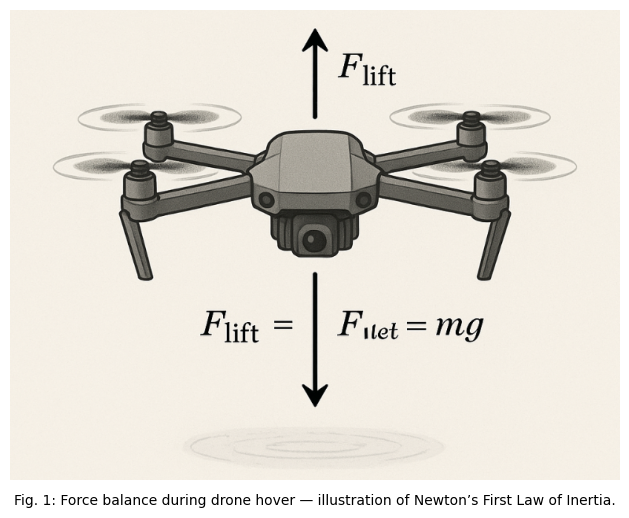

In [33]:
img = mpimg.imread('images/Newton-1st-law.png')

plt.figure(figsize=(7, 5))
plt.imshow(img)
plt.axis('off')

plt.figtext(0.5, -0.02,
            'Fig. 1: Force balance during drone hover — illustration of Newton’s First Law of Inertia.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

---
### Newton's Second Law – Law of Acceleration

> "The acceleration of an object is directly proportional to the net force acting on it and inversely proportional to its mass. The direction of the acceleration is the same as that of the applied force."

> $F = m \cdot a$

#### Application to a Drone:
- Changing the forces (e.g., by adjusting propeller speeds) leads to acceleration:

  $$
  F_{\text{total}} = F_1 + F_2 + F_3 + F_4
  $$

- To ascend:

  $$
  F_{\text{total}} > m \cdot g \Rightarrow a_z > 0
  $$

- For steady hover:

  $$
  F_{\text{total}} = m \cdot g \Rightarrow a = 0
  $$

#### Vector Form:

- The law in three-dimensional space:

  $$
  \vec{F} =
  \begin{bmatrix}
  F_x \\
  F_y \\
  F_z
  \end{bmatrix}
  =
  m \cdot
  \begin{bmatrix}
  a_x \\
  a_y \\
  a_z
  \end{bmatrix}
  $$

#### Rotational Motion:

- For rotation (e.g., yaw):

  $$
  \tau = I \cdot \alpha
  $$

  Where:
  - $\tau$ — torque  
  - $I$ — moment of inertia  
  - $\alpha$ — angular acceleration

- Example of yaw control around the Z axis:

  $$
  \tau_z = k_\tau (\omega_1^2 + \omega_3^2 - \omega_2^2 - \omega_4^2)
  $$

  Where:
  - $\omega_i$ — angular speed of motor $i$  
  - $k_\tau$ — torque coefficient

#### State-Space Representation of the System:

- The drone's state can be described using:

  $$
  \dot{\vec{x}} = A \vec{x} + B \vec{u}
  $$

  $$
  \vec{y} = C \vec{x} + D \vec{u}
  $$

  Where:
  - $\vec{x}$ — state vector (position, velocity, angles, etc.)  
  - $\vec{u}$ — input vector (motor control inputs)  
  - $\vec{y}$ — output vector (measured variables)  
  - $A, B, C, D$ — matrices describing system dynamics

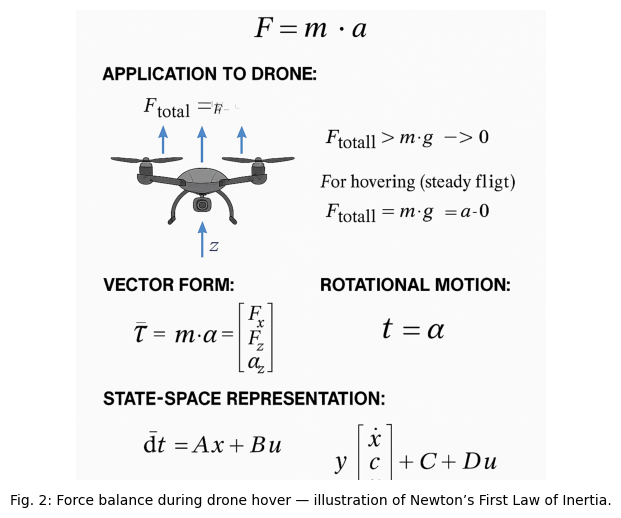

In [34]:
img = mpimg.imread('images/Newton-2nd-law.png')

plt.figure(figsize=(7, 5))
plt.imshow(img)
plt.axis('off')

plt.figtext(0.5, -0.02,
            'Fig. 2: Force balance during drone hover — illustration of Newton’s First Law of Inertia.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

---
### Newton's Third Law – Action and Reaction

> "For every action, there is an equal and opposite reaction."

#### Application to a Drone:
- Each propeller pushes air downward → the air pushes the drone upward.
- This generates lift force, described by the formula:

$$
F_{\text{lift}} = C_L \cdot \frac{1}{2} \cdot \rho \cdot A \cdot v^2
$$

Where:  
- $C_L$ — lift coefficient  
- $\rho$ — air density  
- $A$ — propeller area  
- $v = \omega \cdot r$ — linear speed at the propeller tip

#### Counteracting Reactive Torque:
- Every spinning propeller produces a **reaction torque** (per Newton's 3rd Law).
- To balance torque around the $Z$-axis:

  - Two propellers rotate **clockwise** (CW)  
  - Two rotate **counterclockwise** (CCW)

- This ensures:

$$
\tau_{\text{total}} = \tau_1 + \tau_2 + \tau_3 + \tau_4 = 0
$$

where:

$$
\tau_i = \pm k_\tau \cdot \omega_i^2
$$

#### Matrix Model of Forces and Torques:

Relationship between propeller speeds and the resulting forces and torques:

$$
\begin{bmatrix}
F_z \\
\tau_x \\
\tau_y \\
\tau_z
\end{bmatrix}
=
\begin{bmatrix}
k_f & k_f & k_f & k_f \\
0 & -k_f \cdot l & 0 & k_f \cdot l \\
-k_f \cdot l & 0 & k_f \cdot l & 0 \\
-k_\tau & k_\tau & -k_\tau & k_\tau
\end{bmatrix}
\cdot
\begin{bmatrix}
\omega_1^2 \\
\omega_2^2 \\
\omega_3^2 \\
\omega_4^2
\end{bmatrix}
$$

Where:  
- $k_f$ — thrust coefficient  
- $k_\tau$ — torque coefficient  
- $l$ — distance from the center to each propeller  
- $\omega_i$ — angular speed of propeller $i$

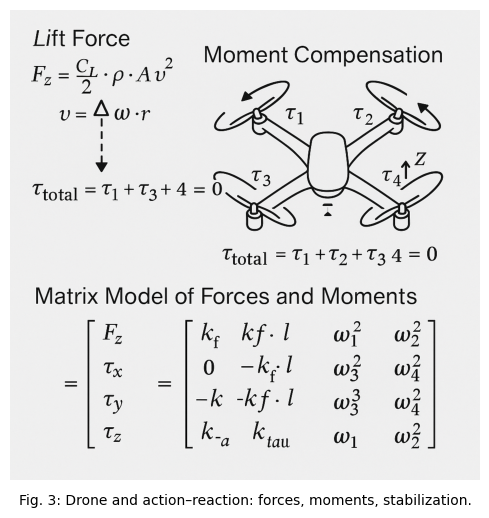

In [35]:
img = mpimg.imread('images/Newton-3th-law.png')

plt.figure(figsize=(7, 5))
plt.imshow(img)
plt.axis('off')

plt.figtext(0.5, -0.02,
            'Fig. 3: Drone and action–reaction: forces, moments, stabilization.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

---
<h2 style="text-align: center;">III. Motor-Based Control</h2>

---
### Pitch Forward

- **Front motors (M1, M2)** slow down  
- **Rear motors (M3, M4)** speed up  
- The drone tilts forward and begins to move forward

<p align="center">
    <img src="images/Pitch-motion.jpg" width="500 ">
    <img src="images/Forward-motion.jpg" width="500 ">
</p>
<p>
    Fig. 4: Forward tilt around the horizontal axis (pitch).
    Fig. 5: Moves forward due to the tilt and the horizontal component of the lift force.
</p>

---
### Roll Right

- **Left side (M1, M4)** slows down  
- **Right side (M2, M3)** speeds up  
- The drone tilts to the right

<p align="center">
    <img src="images/Roll-movement.jpg" width="500">
</p>
<p>
    Fig. 6: The right pair of motors speeds up while the left pair slows down, causing the drone to rotate to the right around the longitudinal axis (roll).
</p>

---
### Yaw Counterclockwise (CCW)

- **CW motors (M1, M3)** slow down  
- **CCW motors (M2, M4)** speed up  
- The drone rotates counterclockwise

<p align="center">
    <img src="images/Yaw-motion.jpg" width="500">
</p>
<p>
    Fig. 7: Accelerated CCW motors and slowed CW motors generate a counterclockwise rotation around the Z-axis.
</p>

---
<h2 style="text-align: center;">IV. Mathematical Simulation</h2>

In [36]:
k = 3.0e-6       # thrust coefficient [N / (rad/s)^2]
d = 0.035        # drag (moment) coefficient [Nm / (rad/s)^2]
l = 0.23         # arm length (distance from center to propeller) [m]
m = 0.5          # mass of the quadcopter [kg]

Ixx = 5.0e-3     # moment of inertia around x-axis [kg*m^2]
Iyy = 5.0e-3     # moment of inertia around y-axis [kg*m^2]
Izz = 9.0e-3     # moment of inertia around z-axis [kg*m^2]
Ir = 3.5e-5      # rotational inertia of rotor [kg*m^2]

Ax = 0.25        # aerodynamic drag along x-axis
Ay = 0.25        # aerodynamic drag along y-axis
Az = 0.5         # aerodynamic drag along z-axis
Ar = 0.2         # rotational drag

g = 9.81         # gravitational acceleration [m/s^2]

In [37]:
def input_profile(t):
    if t < 2:
        return [440, 440, 440, 440]
    elif t < 5:
        return [460, 440, 460, 440] 
    elif t < 8:
        return [430, 420, 430, 420]
    elif t < 10:
        return [440, 440, 440, 440]
    else:
        return [400, 400, 400, 400]

In [38]:
def quad_dynamics(t, x):
    P, Q, R = x[0:3]
    Phi, The, Psi = x[3:6]
    U, V, W = x[6:9]
    X, Y, Z = x[9:12]
    w1, w2, w3, w4 = input_profile(t)

    The = np.clip(The, -np.pi/2 + 0.01, np.pi/2 - 0.01)

    T1 = k * w1**2
    T2 = k * w2**2
    T3 = k * w3**2
    T4 = k * w4**2
    T = T1 + T2 + T3 + T4

    Mphi = l * (T4 - T2)
    Mthe = l * (T3 - T1)
    Mpsi = d * (-T1 + T2 - T3 + T4)
    Omega = w1 - w2 + w3 - w4

    dP = ((Iyy - Izz)/Ixx)*Q*R - Ir/Ixx * Q*Omega + Mphi/Ixx - Ar/Ixx*P
    dQ = ((Izz - Ixx)/Iyy)*P*R + Ir/Iyy * P*Omega + Mthe/Iyy - Ar/Iyy*Q
    dR = ((Ixx - Iyy)/Izz)*P*Q + Mpsi/Izz - Ar/Izz*R

    dPhi = P + np.sin(Phi)*np.tan(The)*Q + np.cos(Phi)*np.tan(The)*R
    dThe = np.cos(Phi)*Q - np.sin(Phi)*R
    dPsi = (np.sin(Phi)/np.cos(The))*Q + (np.cos(Phi)/np.cos(The))*R

    dU = (np.sin(Phi)*np.sin(Psi) + np.cos(Phi)*np.sin(The)*np.cos(Psi)) * T/m - Ax/m*U
    dV = (-np.sin(Phi)*np.cos(Psi) + np.cos(Phi)*np.sin(The)*np.sin(Psi)) * T/m - Ay/m*V
    dW = -g + np.cos(Phi)*np.cos(The)*T/m - Az/m*W

    dX = U
    dY = V
    dZ = W

    return [dP, dQ, dR, dPhi, dThe, dPsi, dU, dV, dW, dX, dY, dZ]

In [39]:
x0 = [
    0, 0, 0,                             # No initial rotation (P, Q, R)
    np.deg2rad(2), np.deg2rad(0), 0,     # Slight tilt (Phi, Theta, Psi)
    0, 0, 0,                             # No initial velocity (U, V, W)
    0, 0, 2                              # Initial position at 2 m height
]

In [40]:
t_span = (0, 10)
t_eval = np.linspace(*t_span, 500)

In [41]:
sol = solve_ivp(quad_dynamics, t_span, x0, t_eval=t_eval, max_step=0.01)

In [42]:
state_names = ['P', 'Q', 'R', 'Phi', 'Theta', 'Psi', 'U', 'V', 'W', 'X', 'Y', 'Z']

df = pd.DataFrame(sol.y.T, columns=state_names)
df['time'] = sol.t

In [43]:
df

,P,Q,R,Phi,Theta,Psi,U,V,W,X,Y,Z,time
0,0.0,0.0,0.000000e+00,0.034907,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,2.000000,0.00000
1,0.0,0.0,0.000000e+00,0.034907,0.000000,0.000000,0.000000e+00,-0.003233,-0.102505,0.000000e+00,-0.000032,1.998969,0.02004
2,0.0,0.0,0.000000e+00,0.034907,0.000000,0.000000,0.000000e+00,-0.006435,-0.202977,0.000000e+00,-0.000129,1.995905,0.04008
3,0.0,0.0,0.000000e+00,0.034907,0.000000,0.000000,0.000000e+00,-0.009604,-0.301454,0.000000e+00,-0.000290,1.990847,0.06012
4,0.0,0.0,0.000000e+00,0.034907,0.000000,0.000000,0.000000e+00,-0.012742,-0.397979,0.000000e+00,-0.000514,1.983836,0.08016
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.0,0.0,-2.494836e-21,0.034785,0.002909,-0.083406,-2.092232e-17,-0.316594,-5.207848,-3.681357e-17,-2.564091,-44.326747,9.91984
496,0.0,0.0,-1.598216e-21,0.034785,0.002909,-0.083406,-2.095480e-17,-0.316671,-5.207027,-3.723318e-17,-2.570436,-44.431105,9.93988
497,0.0,0.0,-1.023832e-21,0.034785,0.002909,-0.083406,-2.098696e-17,-0.316747,-5.206221,-3.765344e-17,-2.576783,-44.535446,9.95992
498,0.0,0.0,-6.558769e-22,0.034785,0.002909,-0.083406,-2.101881e-17,-0.316822,-5.205432,-3.807434e-17,-2.583131,-44.639771,9.97996


In [44]:
df.head

<bound method NDFrame.head of        P    Q             R       Phi     Theta       Psi             U  \
0    0.0  0.0  0.000000e+00  0.034907  0.000000  0.000000  0.000000e+00   
1    0.0  0.0  0.000000e+00  0.034907  0.000000  0.000000  0.000000e+00   
2    0.0  0.0  0.000000e+00  0.034907  0.000000  0.000000  0.000000e+00   
3    0.0  0.0  0.000000e+00  0.034907  0.000000  0.000000  0.000000e+00   
4    0.0  0.0  0.000000e+00  0.034907  0.000000  0.000000  0.000000e+00   
..   ...  ...           ...       ...       ...       ...           ...   
495  0.0  0.0 -2.494836e-21  0.034785  0.002909 -0.083406 -2.092232e-17   
496  0.0  0.0 -1.598216e-21  0.034785  0.002909 -0.083406 -2.095480e-17   
497  0.0  0.0 -1.023832e-21  0.034785  0.002909 -0.083406 -2.098696e-17   
498  0.0  0.0 -6.558769e-22  0.034785  0.002909 -0.083406 -2.101881e-17   
499  0.0  0.0 -4.201611e-22  0.034785  0.002909 -0.083406 -2.104813e-17   

            V         W             X         Y          Z      time 

In [45]:
df.columns

Index(['P', 'Q', 'R', 'Phi', 'Theta', 'Psi', 'U', 'V', 'W', 'X', 'Y', 'Z',
       'time'],
      dtype='object')

In [46]:
df.shape

(500, 13)

In [47]:
df.dtypes

P        float64
Q        float64
R        float64
Phi      float64
Theta    float64
Psi      float64
U        float64
V        float64
W        float64
X        float64
Y        float64
Z        float64
time     float64
dtype: object

In [48]:
df.describe()

,P,Q,R,Phi,Theta,Psi,U,V,W,X,Y,Z,time
count,500.0,500.0,5.000000e+02,500.000000,500.000000,500.000000,5.000000e+02,500.000000,500.000000,5.000000e+02,500.000000,500.000000,500.000000
mean,0.0,0.0,-8.329586e-03,0.034851,0.001599,-0.045822,-3.864336e-18,-0.258746,-4.670250,5.901061e-18,-1.110648,-19.067816,5.000000
std,0.0,0.0,7.764988e-03,0.000049,0.001143,0.032780,1.201703e-17,0.078627,1.073019,1.666071e-17,0.806606,14.287926,2.895428
min,0.0,0.0,-1.890000e-02,0.034785,0.000000,-0.083406,-2.267404e-17,-0.316868,-5.449662,-3.849587e-17,-2.589481,-44.744081,0.000000
25%,0.0,0.0,-1.889965e-02,0.034799,0.000301,-0.078568,-1.911168e-17,-0.307355,-5.307776,0.000000e+00,-1.814178,-31.446203,2.500000
50%,0.0,0.0,-8.925000e-03,0.034852,0.001949,-0.055838,0.000000e+00,-0.304362,-4.929778,3.719071e-18,-1.048009,-18.257736,5.000000
75%,0.0,0.0,-2.616335e-17,0.034905,0.002741,-0.008625,6.787087e-18,-0.234740,-4.657182,1.932652e-17,-0.348868,-6.150608,7.500000
max,0.0,0.0,0.000000e+00,0.034907,0.002909,0.000000,1.625571e-17,0.000000,0.000000,3.077653e-17,0.000000,2.000000,10.000000


In [49]:
positions = df[['X', 'Y', 'Z']].values

for i in range(len(positions)-1):
    print(positions[i], positions[i+1])
    if i > 10:
        break

[0. 0. 2.] [ 0.00000000e+00 -3.24530361e-05  1.99896946e+00]
[ 0.00000000e+00 -3.24530361e-05  1.99896946e+00] [ 0.00000000e+00 -1.29380375e-04  1.99590516e+00]
[ 0.00000000e+00 -1.29380375e-04  1.99590516e+00] [ 0.00000000e+00 -2.90139207e-04  1.99084745e+00]
[ 0.00000000e+00 -2.90139207e-04  1.99084745e+00] [ 0.00000000e+00 -5.14093132e-04  1.98383587e+00]
[ 0.00000000e+00 -5.14093132e-04  1.98383587e+00] [ 0.00000000e+00 -8.00612094e-04  1.97490920e+00]
[ 0.00000000e+00 -8.00612094e-04  1.97490920e+00] [ 0.00000000e+00 -1.14907232e-03  1.96410542e+00]
[ 0.00000000e+00 -1.14907232e-03  1.96410542e+00] [ 0.00000000e+00 -1.55885625e-03  1.95146179e+00]
[ 0.00000000e+00 -1.55885625e-03  1.95146179e+00] [ 0.         -0.00202935  1.9370148 ]
[ 0.         -0.00202935  1.9370148 ] [ 0.         -0.00255996  1.92080024]
[ 0.         -0.00255996  1.92080024] [ 0.         -0.00315007  1.90285317]
[ 0.         -0.00315007  1.90285317] [ 0.         -0.00379909  1.88320797]
[ 0.         -0.0037990

In [50]:
def controller(current_angles, ref_angles):
    Kp = np.array([5.0, 5.0, 2.0])
    error = ref_angles - current_angles
    return Kp * error 

In [51]:
def quad_dynamics(t, state, ref_phi, ref_theta, ref_psi):
    phi, theta, psi = state[0], state[1], state[2]
    
    ref = np.radians([
        np.interp(t, time_array, ref_phi),
        np.interp(t, time_array, ref_theta),
        np.interp(t, time_array, ref_psi)
    ])
    angles = np.array([phi, theta, psi])
    
    control = controller(angles, ref)
    
    dphi = control[0]
    dtheta = control[1]
    dpsi = control[2]
    
    return [dphi, dtheta, dpsi]

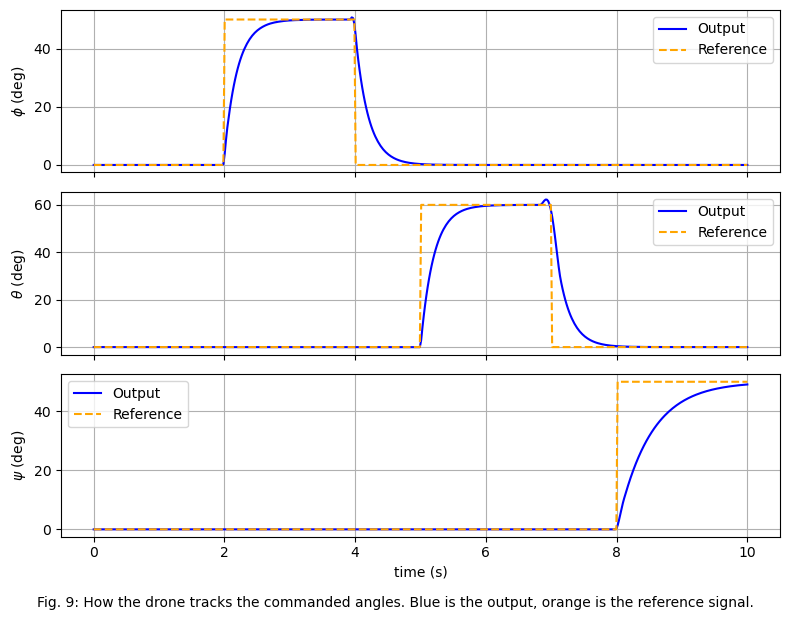

In [52]:
t0, tf = 0, 10
time_array = np.linspace(t0, tf, 500)

ref_phi = np.where((time_array >= 2) & (time_array <= 4), 50, 0)  
ref_theta = np.where((time_array >= 5) & (time_array <= 7), 60, 0) 
ref_psi = np.where((time_array >= 8) & (time_array <= 10), 50, 0)  

y0 = [np.radians(0), np.radians(0), np.radians(0)]

sol = solve_ivp(
    fun=lambda t, y: quad_dynamics(t, y, ref_phi, ref_theta, ref_psi),
    t_span=(t0, tf),
    y0=y0,
    t_eval=time_array,
    method='RK45'
)

phi = np.degrees(sol.y[0])
theta = np.degrees(sol.y[1])
psi = np.degrees(sol.y[2])
time = sol.t

fig, axs = plt.subplots(3, 1, figsize=(8, 6), sharex=True)

axs[0].plot(time, phi, label='Output', color='blue')
axs[0].plot(time, ref_phi, '--', label='Reference', color='orange')
axs[0].set_ylabel(r'$\phi$ (deg)')
axs[0].legend()
axs[0].grid(True)

axs[1].plot(time, theta, label='Output', color='blue')
axs[1].plot(time, ref_theta, '--', label='Reference', color='orange')
axs[1].set_ylabel(r'$\theta$ (deg)')
axs[1].legend()
axs[1].grid(True)

axs[2].plot(time, psi, label='Output', color='blue')
axs[2].plot(time, ref_psi, '--', label='Reference', color='orange')
axs[2].set_ylabel(r'$\psi$ (deg)')
axs[2].set_xlabel('time (s)')
axs[2].legend()
axs[2].grid(True)

plt.figtext(0.5, -0.02,
            'Fig. 9: How the drone tracks the commanded angles. Blue is the output, orange is the reference signal.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

In [53]:
euler_rad = np.vstack([np.radians(phi), np.radians(theta), np.radians(psi)]).T
rot = R.from_euler('xyz', euler_rad)
quat = rot.as_quat()

q1 = quat[:, 0]
q2 = quat[:, 1]
q3 = quat[:, 2]
q0 = quat[:, 3]

In [54]:
ref_euler_rad = np.radians(np.vstack([ref_phi, ref_theta, ref_psi]).T)
ref_rot = R.from_euler('xyz', ref_euler_rad)
ref_quat = ref_rot.as_quat()

ref_q1 = ref_quat[:, 0]
ref_q2 = ref_quat[:, 1]
ref_q3 = ref_quat[:, 2]
ref_q0 = ref_quat[:, 3]

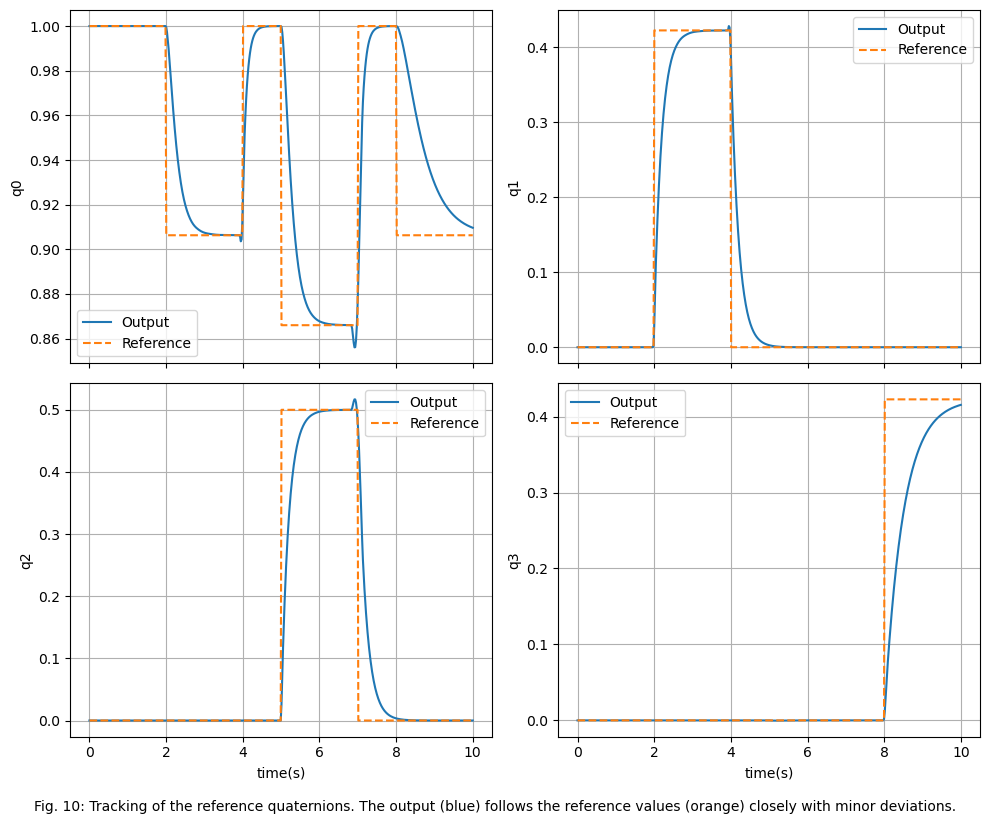

In [55]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True)

axs[0, 0].plot(time, q0, label='Output')
axs[0, 0].plot(time, ref_q0, '--', label='Reference')
axs[0, 0].set_ylabel('q0'); axs[0, 0].legend(); axs[0, 0].grid(True)

axs[0, 1].plot(time, q1, label='Output')
axs[0, 1].plot(time, ref_q1, '--', label='Reference')
axs[0, 1].set_ylabel('q1'); axs[0, 1].legend(); axs[0, 1].grid(True)

axs[1, 0].plot(time, q2, label='Output')
axs[1, 0].plot(time, ref_q2, '--', label='Reference')
axs[1, 0].set_ylabel('q2'); axs[1, 0].set_xlabel('time(s)'); axs[1, 0].legend(); axs[1, 0].grid(True)

axs[1, 1].plot(time, q3, label='Output')
axs[1, 1].plot(time, ref_q3, '--', label='Reference')
axs[1, 1].set_ylabel('q3'); axs[1, 1].set_xlabel('time(s)'); axs[1, 1].legend(); axs[1, 1].grid(True)


plt.figtext(0.5, -0.02,
            'Fig. 10: Tracking of the reference quaternions. The output (blue) follows the reference values (orange) closely with minor deviations.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

In [56]:
omega_log = np.array([input_profile(t) for t in time_array])
df['omega1'] = omega_log[:, 0]
df['omega2'] = omega_log[:, 1]
df['omega3'] = omega_log[:, 2]
df['omega4'] = omega_log[:, 3]

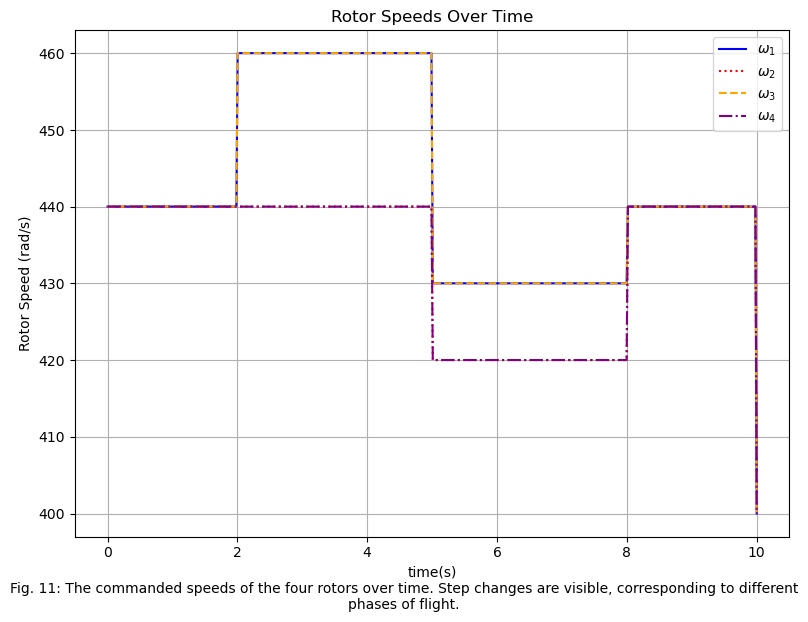

In [57]:
plt.figure(figsize=(8, 6))

plt.plot(df['time'], df['omega1'], label=r'$\omega_1$', linestyle='-', color='blue')
plt.plot(df['time'], df['omega2'], label=r'$\omega_2$', linestyle=':', color='red')
plt.plot(df['time'], df['omega3'], label=r'$\omega_3$', linestyle='--', color='orange')
plt.plot(df['time'], df['omega4'], label=r'$\omega_4$', linestyle='-.', color='purple')

plt.xlabel('time(s)')
plt.ylabel('Rotor Speed (rad/s)')
plt.title('Rotor Speeds Over Time')
plt.grid(True)
plt.legend()

plt.figtext(0.5, -0.02,
            'Fig. 11: The commanded speeds of the four rotors over time. Step changes are visible, corresponding to different phases of flight.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

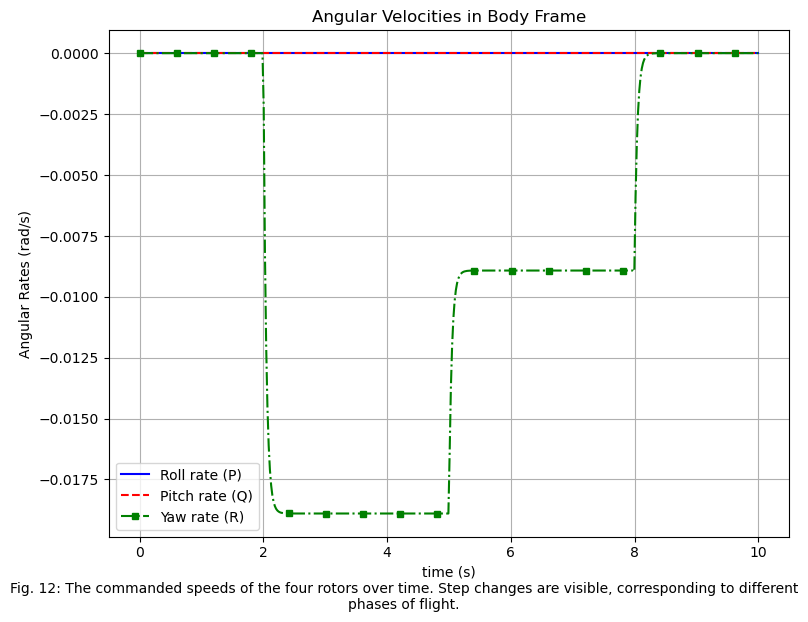

In [58]:
t = df['time']
P = df['P']   
Q = df['Q']   
R = df['R']   

plt.figure(figsize=(8, 6))

plt.plot(t, P, label='Roll rate (P)', color='blue')
plt.plot(t, Q, '--', label='Pitch rate (Q)', color='red')
plt.plot(t, R, '-.', label='Yaw rate (R)', color='green', marker='s', markevery=30, markersize=4)

plt.xlabel('time (s)')
plt.ylabel('Angular Rates (rad/s)')
plt.title('Angular Velocities in Body Frame')
plt.grid(True)
plt.legend()

plt.figtext(0.5, -0.02,
            'Fig. 12: The commanded speeds of the four rotors over time. Step changes are visible, corresponding to different phases of flight.',
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

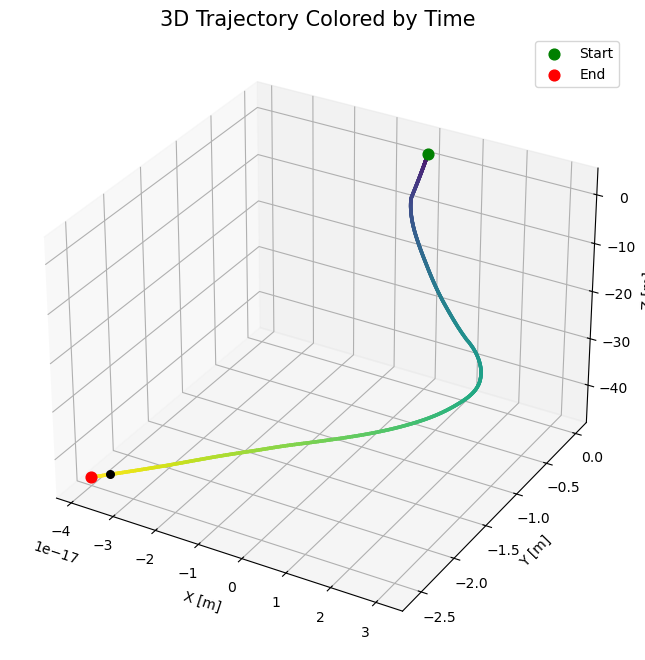

In [59]:
X = df['X']
Y = df['Y']
Z = df['Z']
t = df['time']

norm_time = (t - t.min()) / (t.max() - t.min())
colors = cm.viridis(norm_time)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

for i in range(len(t) - 1):
    ax.plot(X[i:i+2], Y[i:i+2], Z[i:i+2], color=colors[i], linewidth=2.5)

ax.scatter(X.iloc[0], Y.iloc[0], Z.iloc[0], color='green', s=60, label='Start')
ax.scatter(X.iloc[-1], Y.iloc[-1], Z.iloc[-1], color='red', s=60, label='End')

moving_marker = ax.scatter([], [], [], color='black', s=30)

ax.set_xlabel('X [m]')
ax.set_ylabel('Y [m]')
ax.set_zlabel('Z [m]')
ax.set_title('3D Trajectory Colored by Time', fontsize=15)
ax.legend()

def init():
    moving_marker._offsets3d = ([], [], [])
    return moving_marker,

def update(frame):
    x = X.iloc[frame]
    y = Y.iloc[frame]
    z = Z.iloc[frame]
    moving_marker._offsets3d = ([x], [y], [z])
    return moving_marker,

step = 10
frames = range(0, len(t), step)

ani = FuncAnimation(fig, update, frames=frames, init_func=init, blit=True, interval=30)

HTML(ani.to_jshtml())

---
<h2 style="text-align: center;">V. Conclusion</h2>

---
Mathematical modeling of the lift force in a quadcopter is essential for understanding, analyzing, and controlling its behavior in flight. By modeling the aerodynamic forces generated by the rotors, we can accurately compute how lift is produced based on the angular velocity of each motor, the geometry of the frame, and the physical properties of the air.

Such a model allows us to:

- Predict **the forces and torques generated by specific motor commands**;
- Formulate **the equations of motion of the quadcopter**, including vertical stabilization and positioning;
- Develop **automated control systems** that use feedback to maintain balance, altitude, or trajectory.

Lift is not merely the result of rotor spinning — it is part of a complex nonlinear dynamic system, dependent on the symmetry of the structure, motor interactions, and external factors such as wind. Therefore, the mathematical model must be both sufficiently accurate and adaptable to real-world conditions.

---
<h2 style="text-align: center;">References</h2>

---
1. [Quadcopter Drone – MATLAB & Simulink Example – MathWorks](https://www.mathworks.com/help/sps/ug/quadcopter-drone.html)  
2. [CFD Simulation Vorticity Visualization – ResearchGate](https://www.researchgate.net/figure/CFD-simulation-vorticity-The-region-of-vortex-allows-to-observe-the-magnitudes-of-the_fig5_329958792)  
3. [How Do Drones Work? – Lesics](https://www.lesics.com/how-does-drones-work.html)  
4. [Newton’s First Law – Khan Academy](https://www.khanacademy.org/science/in-in-class11th-physics/in-in-class11th-physics-laws-of-motion/in-in-class-11-newtons-first-law-mass-and-inertia/a/what-is-newtons-first-law)  
5. [Newton’s Second Law – The Physics Classroom](https://www.physicsclassroom.com/class/newtlaws/lesson-3/newton-s-second-law)  
6. [Newton’s Laws of Motion – NASA Glenn Research Center](https://www1.grc.nasa.gov/beginners-guide-to-aeronautics/newtons-laws-of-motion/)
---